<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [113]:
import IPython 
from matplotlib import pyplot as plt
from scipy import signal
from scipy.io import wavfile
import numpy as np
from scipy.fftpack import ifft, fft
import imageio
from scipy.fftpack import fft2, ifft2
import scipy

In [114]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [115]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        #initialize the rate and sample
        self.rate = rate
        self.samples = samples
        self.time = len(samples)/rate
        
    # Problems 1.1 and 1.7
    def plot(self, dft = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #when sound wave and dft graph plots are both required
        if dft:
            #The sound wave
            plt.subplot(121)
            plt.title("Sound Waves")
            x = np.linspace(0, self.time, len(self.samples))
            plt.plot(x, self.samples, lw=0.5)
            plt.ylim(-32768,32767)
            plt.xlabel("Seconds")
            plt.ylabel("Amplitudes")
            #The DFT
            plt.subplot(122)
            plt.title("DFT of the sound wave")
            #calculate the time, set the limit, and plot the data
            n = len(self.samples)
            x = np.linspace(0, len(self.samples), len(self.samples))
            plt.plot(x[:n//2], np.abs(fft(self.samples))[:n//2],lw=0.5)
            plt.xlabel("frequency(Hz)")
            plt.ylabel("magnitude")
            plt.show()
        #only the sound wave graph
        else:
            #calculate the time, set the limit, and plot the data
            plt.title("Sound Waves")
            x = np.linspace(0, self.time, len(self.samples))
            plt.plot(x, self.samples, lw=0.5)
            #setting the limit
            plt.ylim(-32768,32767)
            plt.xlabel("Seconds")
            plt.ylabel("Amplitudes")
            plt.show()
    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #check th condition, if it satisfies, scale the data
        if force or self.samples.dtype != "int16":
            scaled = np.int16(self.samples*32767.0/max(self.samples))
            wavfile.write(filename, self.rate, scaled)
        else:
            wavfile.write(filename, self.rate, self.samples)
        
        
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #check the condition
        if len(self.samples) != len(other.samples):
            raise ValueError("The sample arrays are not the same length")
        else:
            #add the samples
            return SoundWave(self.rate, self.samples + other.samples)
    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check the condition
        if self.rate != other.rate:
            raise ValueError("The sample arrays are not the same length")
        else:
            #rshift the samples
            return SoundWave(self.rate, np.concatenate((self.samples,other.samples), axis = None))
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Raises:ValueError: if the two sample rates are not equal.
        if self.rate != other.rate:
            raise ValueError("the sample rates from A and B are not equal")
        # A and B are the same length
        if len(self.samples) == len(other.samples):            
            return SoundWave(self.rate, ifft(fft(np.array(self.samples))*fft(np.array(other.samples))).real)
        # A and B are not the same length
        elif len(self.samples) < len(other.samples):
            #append zero
            temp = np.zeros(len(other.samples))           
            temp[:len(self.samples)] = self.samples
            return SoundWave(self.rate, ifft(fft(np.array(temp))*fft(np.array(other.samples))).real)
        elif len(self.samples) > len(other.samples):
            #append zero
            temp = np.zeros(len(self.samples))           
            temp[:len(other.samples)] = other.samples
            return SoundWave(self.rate, ifft(fft(np.array(temp))*fft(np.array(other.samples))).real)
    
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Raises:ValueError: if the two sample rates are not equal.
        if self.rate != other.rate:
            raise ValueError("the sample rates from A and B are not equal")
        
        n = len(self.samples)
        m = len(other.samples)
        #find a such that 2**a > m+n-1
        a = 0
        while 2**a < n + m -1:
            a += 1
        #append zero
        temp1 = np.zeros(2**a) 
        temp2 = np.zeros(2**a)         
        temp1[:n] = self.samples
        temp2[:m] = other.samples   
        #return the convolution
        return SoundWave(self.rate, (ifft(fft(temp1)*fft(temp2)).real)[:n+m-1])

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #record the length of the file
        n = len(self.samples)
        #calculate the integers for low and high frequencies 
        k_low = int(low_freq*n/self.rate)
        k_high = int(high_freq*n/self.rate)
        #calculate the dft
        dft = fft(self.samples)
        zero = [0]*len(dft)
        #Set the entries of the signal’s DFT from klow to khigh and from n − khigh to n − klow to zero 
        dft[k_low:k_high] = zero[k_low:k_high]
        dft[n-k_high:n-k_low] = zero[n-k_high:n-k_low]
        #return the clean file
        return SoundWave(self.rate, ifft(dft).real)
        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

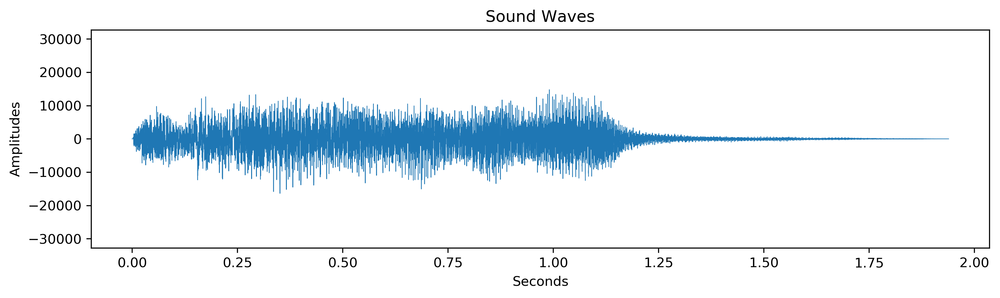

In [116]:
#read the file and plot it
rate1, samples1 = wavfile.read("tada.wav")
sound = SoundWave(rate1, samples1)
sound.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [117]:
#create the original file and scaled file
sound.export("tada_Original.wav", False)
sound.export("tada_Scaled.wav", True)

In [118]:
#display the original file
IPython.display.Audio(filename="tada_Original.wav")

In [119]:
#display the scaled file
IPython.display.Audio(filename="tada_Scaled.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [120]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #initilize the rate and sample
    rate = 44100
    x = np.linspace(0,duration, rate*duration)
    sample = np.sin(2*np.pi*x*frequency)
    #create the class for the note
    note = SoundWave(rate, sample)
    return note

In [121]:
#generate note A
A = generate_note(440, 2)
#display the note A
IPython.display.Audio(rate = A.rate, data = A.samples)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [122]:
A = generate_note(440, 3)
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)
#generate A minor by adding A, C, G, and then display it
Aminor = A + C + E
IPython.display.Audio(rate = Aminor.rate, data = Aminor.samples)


In [123]:
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)
#generate a arpeggio by shifting A, C, G, and then display it
arpeggio = A >> C >> E
IPython.display.Audio(rate = arpeggio.rate, data = arpeggio.samples)


### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [124]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #Initilize and then return the dft
    n = len(samples)
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j * np.pi/n)*m @ m.T)
    return W@ samples / n

In [125]:
#generate a random sample and then test 
#if it is consistent with the built in function
f = np.random.random(100)
f1 = simple_dft(f)
f2 = fft(f)
np.allclose(100*f1, f2)


True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [126]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    
    if n <= threshold:
        return simple_dft(samples)
    else:
        f_even = simple_fft(samples[::2])
        f_odd = simple_fft(samples[1::2])
        w = np.exp((-2j * np.pi/n) * np.arange(n))
        first_sum = f_even + w[:n//2] * f_odd
        second_sum = f_even + w[n//2:] * f_odd
        return 0.5 * np.concatenate([first_sum, second_sum])
        
        

In [127]:
#generate a random sample and then test 
#if it is consistent with the built in function
#then time all three functions
g = np.random.random(8192)
print("time for dft")
%time f1 = simple_dft(g)
print("time for fft")
%time g1 = simple_fft(g)
print("time for build in fft")
%time g2 = fft(g)
np.allclose(8192*g1, g2)

time for dft
CPU times: user 3.43 s, sys: 1.29 s, total: 4.72 s
Wall time: 4.25 s
time for fft
CPU times: user 169 ms, sys: 8 ms, total: 177 ms
Wall time: 170 ms
time for build in fft
CPU times: user 588 µs, sys: 350 µs, total: 938 µs
Wall time: 771 µs


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

A note


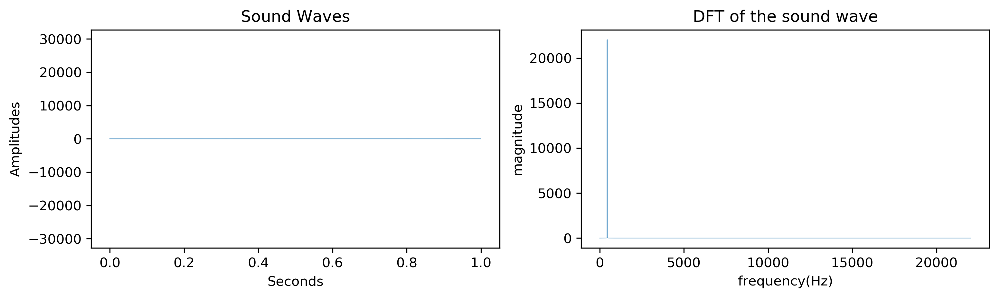

A minor


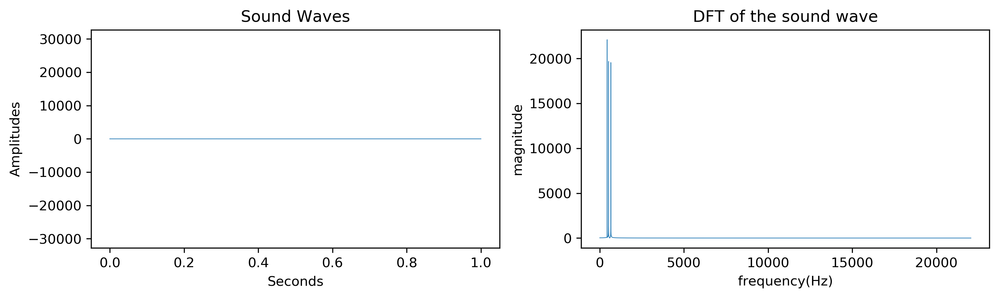

In [128]:
#generate note A and A minor
#Display the wavesound and DFT plots of the A tone and the A minor 
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)
Aminor = A + C + E
sound1 = SoundWave(A.rate, A.samples)
print("A note")
sound1.plot(True)
sound2 = SoundWave(Aminor.rate, Aminor.samples)
print("A minor")
sound2.plot(True)


### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

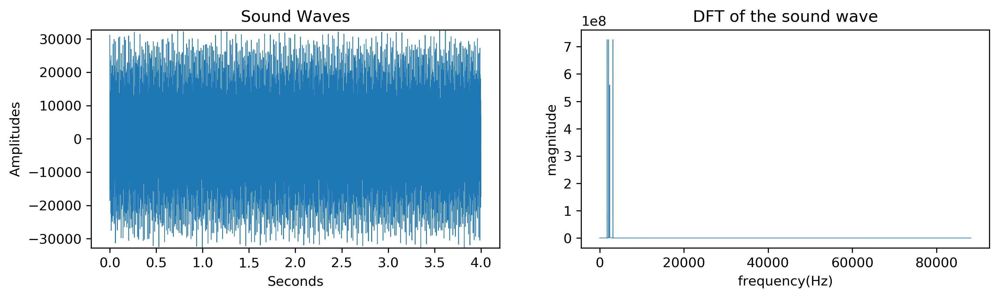

In [129]:
#read the file and Display the wavesound and DFT plots 
rate2, samples2 = wavfile.read("mystery_chord.wav")
sound = SoundWave(rate2, samples2)
sound.plot(True)

In [130]:
#find the peak of the graph, then find the according frequencies
n = len(samples2)
x = np.linspace(0, len(samples2), len(samples2))[:n//2]
index = np.argsort(np.abs(fft(samples2))[:n//2])
Frequ = index[-4:]/n*rate2
print("The dominant frequencies are: ")
print(Frequ)

The dominant frequencies are: 
[587.5  523.25 784.   440.  ]


The notes are D, C, G, A...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [131]:
#load the tada.wav file
tada = SoundWave(rate1,samples1)
#generate the white noise
rate_noise = 22050
white_noise_samples = np.random.randint(-32767, 32767, rate_noise*2, dtype=np.int16)
white_noise = SoundWave(rate_noise,white_noise_samples)
#Compute the circular convolution of tada.wav and the white noise. 
circu = tada * white_noise
#embed the result
IPython.display.Audio(rate = circu.rate, data = circu.samples)



In [132]:
#Append the circular convolution to itself
circu2 = circu >> circu
IPython.display.Audio(rate = circu2.rate, data = circu2.samples)



### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [133]:
#read file and store the rates and samples
rateCGC, samplesCGC = wavfile.read("CGC.wav")
rateGCG, samplesGCG = wavfile.read("GCG.wav")
CGC = SoundWave(rateCGC, samplesCGC)
GCG = SoundWave(rateGCG, samplesGCG)
linear = CGC ** GCG



In [134]:
print("CGC.wav")
IPython.display.Audio(rate = CGC.rate, data = CGC.samples)


CGC.wav


In [135]:
print("GCG.wav")
IPython.display.Audio(rate = GCG.rate, data = GCG.samples)


GCG.wav


In [136]:
print("linear convolution file")
IPython.display.Audio(rate = linear.rate, data = linear.samples)


linear convolution file


In [137]:
print("linear convolution file with build in function")
linea =scipy.signal.fftconvolve(CGC.samples, GCG.samples)
IPython.display.Audio(rate = linear.rate, data = linea)


linear convolution file with build in function


### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [138]:
#read file and store the rates and samples
rate_chop, samples_chop = wavfile.read("chopin.wav")
rate_ball, samples_ball = wavfile.read("balloon.wav")
chop = SoundWave(rate_chop, samples_chop)
ball = SoundWave(rate_ball, samples_ball)
#generate teh linear convolution and show it
linear1 = chop ** ball
print("chopin.wav")
IPython.display.Audio(rate = chop.rate, data = chop.samples)


chopin.wav


In [139]:
print("balloon.wav")
IPython.display.Audio(rate = ball.rate, data = ball.samples)


balloon.wav


In [140]:
print("the linear convolution of chopin.wav and balloon.wav")
IPython.display.Audio(rate = linear1.rate, data = linear1.samples)


the linear convolution of chopin.wav and balloon.wav


### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [141]:
#read file and store the rates and samples
rate_noisy1, samples_noisy1 = wavfile.read("noisy1.wav")
rate_noisy2, samples_noisy2 = wavfile.read("noisy2.wav")
noisy1 = SoundWave(rate_noisy1, samples_noisy1)
noisy2 = SoundWave(rate_noisy2, samples_noisy2)

In [142]:
print("noisy1.wav")
IPython.display.Audio(rate = noisy1.rate, data = noisy1.samples)


noisy1.wav


In [143]:
print("clean noisy1 file")
clean_noisy1 = noisy1.clean(1250,2600)
IPython.display.Audio(rate = clean_noisy1.rate, data = clean_noisy1.samples)


clean noisy1 file


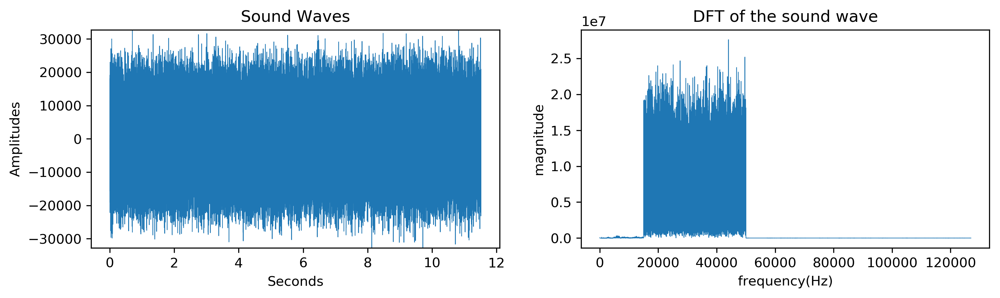

the noise is between 1300 and 6000 Hz


In [144]:
#find the noise
noisy2.plot(True)
print("the noise is between 1300 and 6000 Hz")


In [145]:
print("noisy2.wav")
IPython.display.Audio(rate = noisy2.rate, data = noisy2.samples)


noisy2.wav


In [146]:
print("clean noise2 file")
clean_noisy2 = noisy2.clean(1300,6000)
IPython.display.Audio(rate = clean_noisy2.rate, data = clean_noisy2.samples)



clean noise2 file


### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [147]:
rate_vuvuzela, samples_vuvuzela = wavfile.read("vuvuzela.wav")
vuvuzela = SoundWave(rate_vuvuzela, samples_vuvuzela.T)
IPython.display.Audio(rate = vuvuzela.rate, data = vuvuzela.samples)


In [148]:
vuvuzela1 = SoundWave(rate_vuvuzela, samples_vuvuzela.T[0,:])
vuvuzela2 = SoundWave(rate_vuvuzela, samples_vuvuzela.T[1,:])

In [149]:
clean_vuvuzela2 = vuvuzela2.clean(100,600)
clean_vuvuzela1 = vuvuzela1.clean(100,600)
clean_vuvuzela = SoundWave(clean_vuvuzela1.rate, np.vstack([clean_vuvuzela1.samples,clean_vuvuzela2.samples]))
clean_vuvuzela = SoundWave(clean_vuvuzela1.rate, clean_vuvuzela1.samples)


In [150]:
IPython.display.Audio(rate = clean_vuvuzela.rate, data = clean_vuvuzela.samples)


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

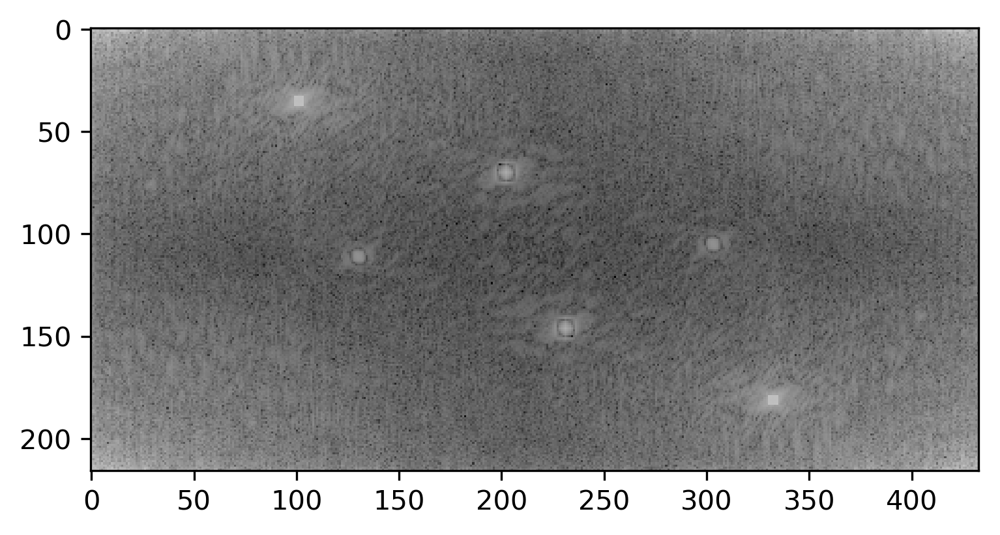

In [151]:
#show the original image
im = imageio.imread("license_plate.png")
im_dft = fft2(im)
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

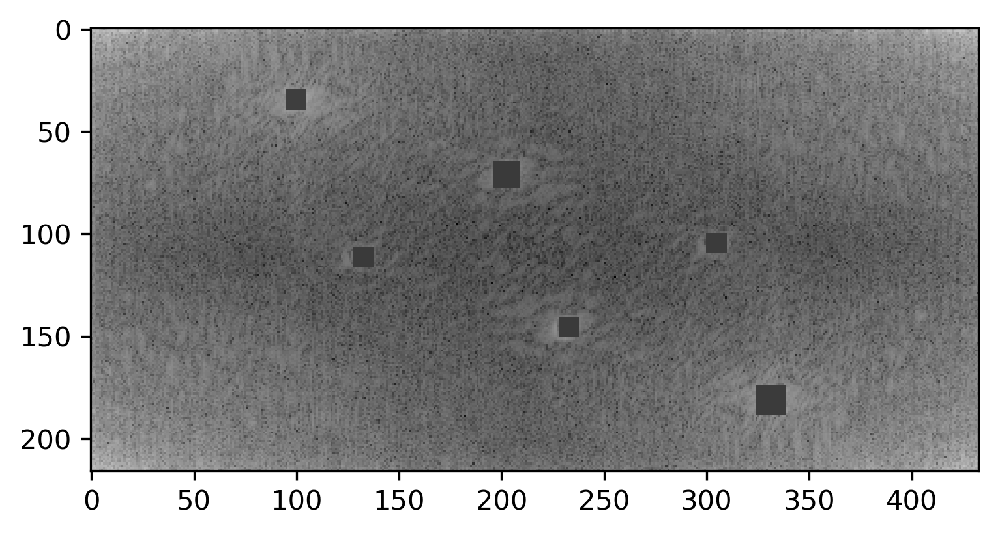

In [152]:
#show the image woth blocked area
im_dft[30:40,95:105] = [[np.mean(im_dft)]*10]*10
im_dft[65:78,196:209] = [[np.mean(im_dft)]*13]*13
im_dft[107:117,128:138] = [[np.mean(im_dft)]*10]*10
im_dft[141:151,228:238] = [[np.mean(im_dft)]*10]*10
im_dft[100:110,300:310] = [[np.mean(im_dft)]*10]*10
im_dft[174:189,324:339] = [[np.mean(im_dft)]*15]*15
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

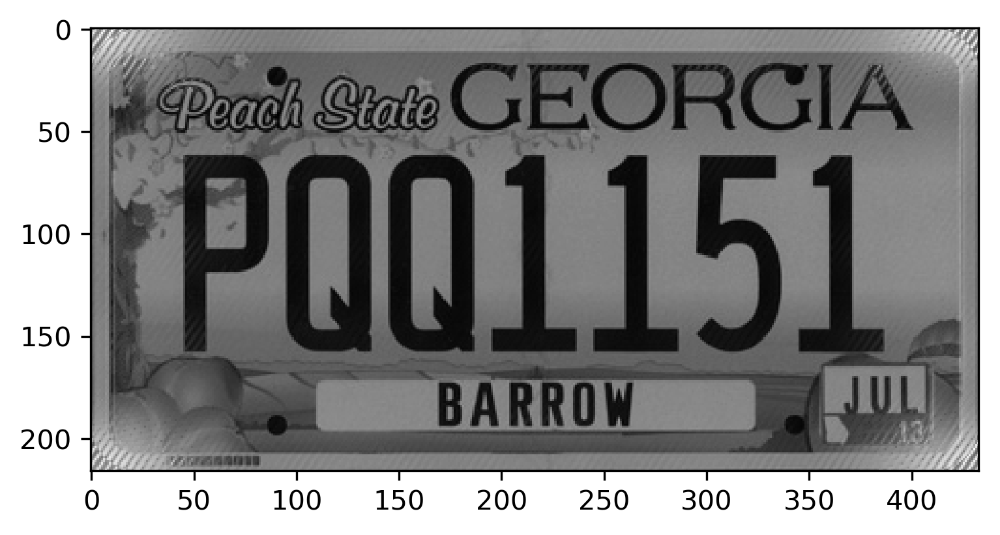

In [153]:
#show the lisence plate after it got cleaned
plt.imshow(ifft2(im_dft).real, cmap="gray")
plt.show()

The year on the sticker is 13.